# Task 1 - Distribution of genes among the different clusters
This notebook analyses the distribution of individual genes among the different clusters.

This notebook is based on the single-cell tutorial (https://github.com/theislab/single-cell-tutorial). For further explanations of the applied methods please refer to above source.

In [1]:
import scanpy as sc
import anndata as ad
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import os
from os import listdir
from os.path import isfile, join
import logging

In [2]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
sc.logging.print_versions()

-----
anndata     0.8.0
scanpy      1.9.1
-----
PIL                 9.2.0
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
cffi                1.15.1
colorama            0.4.6
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.3
decorator           5.1.1
defusedxml          0.7.1
entrypoints         0.4
future_fstrings     NA
google              NA
h5py                3.7.0
igraph              0.9.11
ipykernel           6.16.2
ipython_genutils    0.2.0
jedi                0.18.1
joblib              1.2.0
kiwisolver          1.4.4
leidenalg           0.8.10
llvmlite            0.39.1
louvain             0.7.2
matplotlib          3.5.3
mpl_toolkits        NA
natsort             8.2.0
nbinom_ufunc        NA
numba               0.56.3
numpy               1.21.6
packaging           21.3
pandas              1.3.5
parso               0.8.3
pexpect             4.8.0
pickleshare         0.7.5
pkg_resources       NA
prompt_t

### Load adata

In [3]:
adata_ref = sc.read_h5ad('../data/adata/processed_adata1.h5ad')
adata = sc.read_h5ad('../data/adata/processed_adata3.h5ad')
sc.tl.louvain(adata_ref, resolution=0.55, key_added='louvain', random_state=10)
sc.tl.louvain(adata, resolution=0.55, key_added='louvain', random_state=10)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 5 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:01)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


ingest

In [4]:
var_names = adata_ref.var_names.intersection(adata.var_names)
adata_ref = adata_ref[:, var_names]
adata = adata[:, var_names]

In [5]:
sc.pp.pca(adata_ref)
sc.pp.neighbors(adata_ref)
sc.tl.umap(adata_ref)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:19)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:51)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)


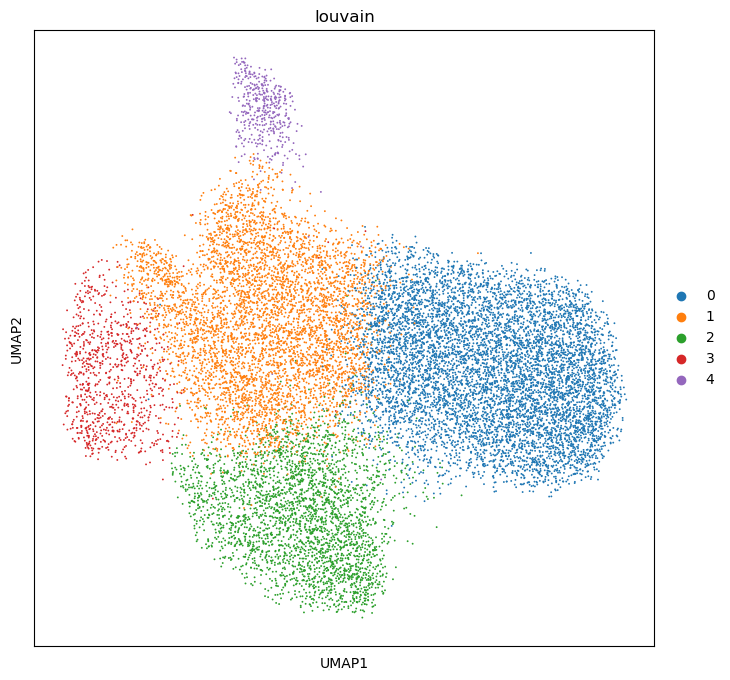

In [6]:
sc.pl.umap(adata_ref, color='louvain')

In [7]:
sc.tl.ingest(adata, adata_ref, obs='louvain')

running ingest
    finished (0:00:33)


In [8]:
adata.uns['louvain_colors'] = adata_ref.uns['louvain']  # fix colors

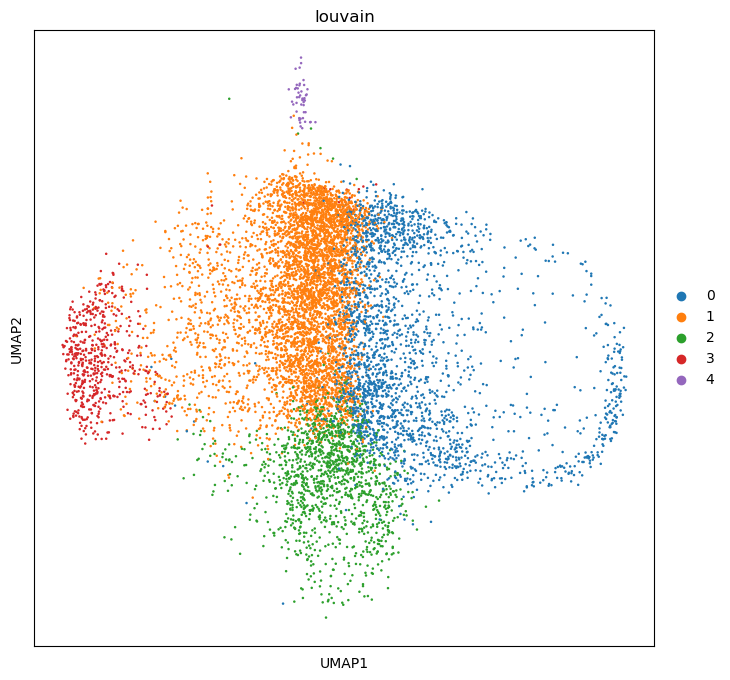

In [9]:
sc.pl.umap(adata, color=['louvain'], wspace=0.5)

In [10]:
adata_concat = adata_ref.concatenate(adata, batch_categories=['9591-2D', '16992-2D'])

/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [11]:
adata_concat.obs.louvain = adata_concat.obs.louvain.astype('category')
adata_concat.obs.louvain.cat.reorder_categories(adata_ref.obs.louvain.cat.categories, inplace=True)  # fix category ordering
adata_concat.uns['louvain_colors'] = adata_ref.uns['louvain_colors']  # fix category colors

/home/icb/till.richter/anaconda3/envs/scib-pipeline-R4.0/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  


In [12]:
os.path.exists("/figures/combined/UMAPs.pdf")

False

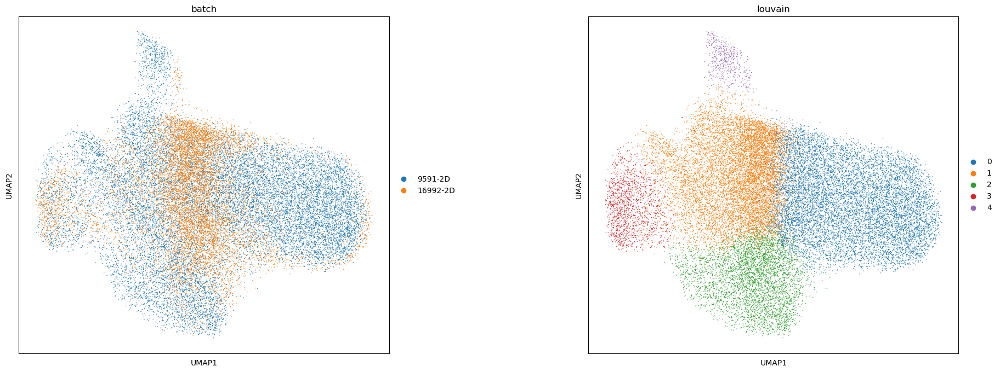

In [13]:
sc.pl.umap(adata_concat, color=['batch', 'louvain'], wspace=0.4, save='/combined/UMAPs.pdf')
os.rename("figures/umap/combined/UMAPs.pdf", 
          "../results/extra_q/UMAP.pdf")


<a id="Markers"></a>

In [14]:
#Calculate marker genes
adata.uns['log1p']["base"] = None
sc.tl.rank_genes_groups(adata, groupby='louvain', key_added='rank_genes_r0.5')

ranking genes
    finished: added to `.uns['rank_genes_r0.5']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


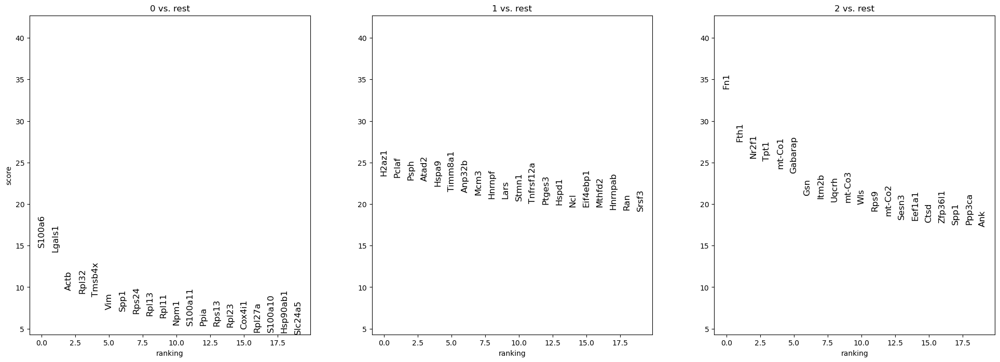

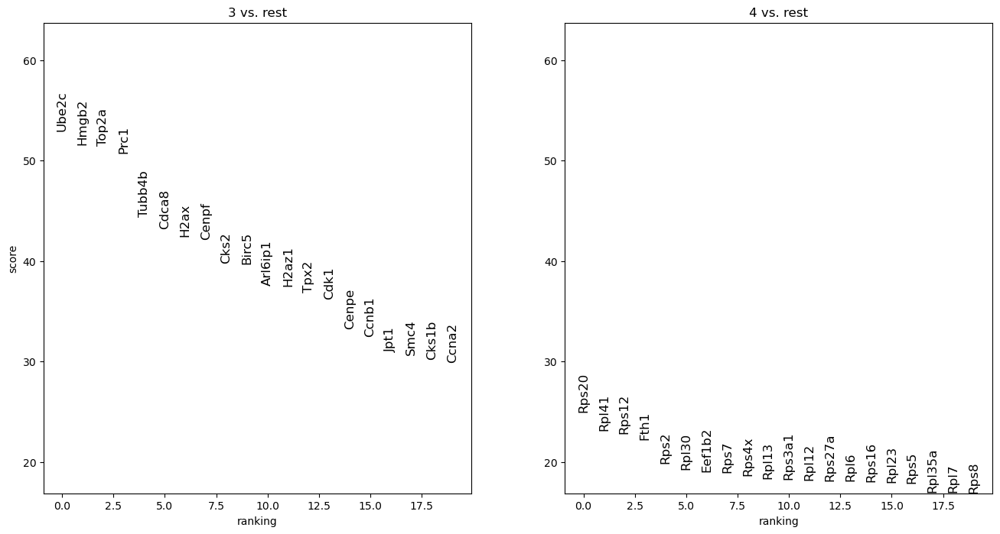

In [15]:
#Plot marker genes
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.5', groups=['0','1','2'], fontsize=12)
sc.pl.rank_genes_groups(adata, key='rank_genes_r0.5', groups=['3','4'], fontsize=12)

In [16]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

### Cluster 0

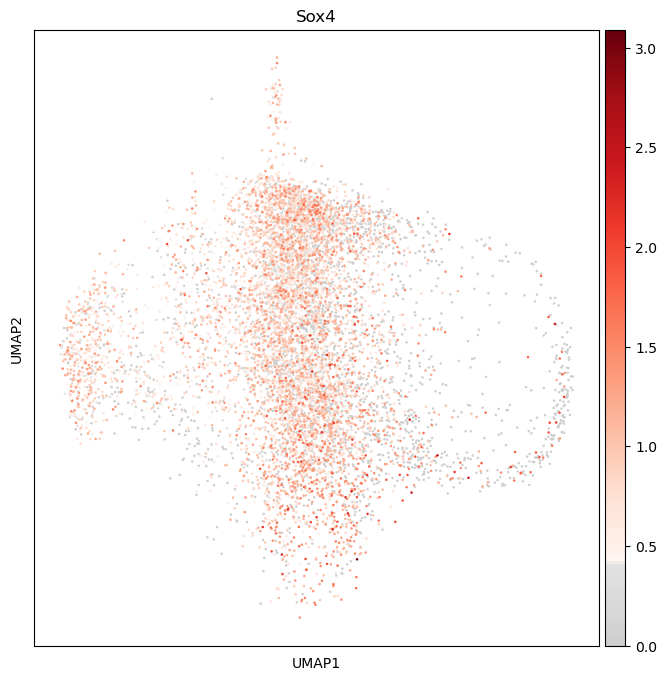

In [17]:
# Sox4
sc.pl.umap(adata, color='Sox4', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Sox4.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Sox4.pdf", 
          "../results/task1/9591-2D/Cluster0/Sox4.pdf")

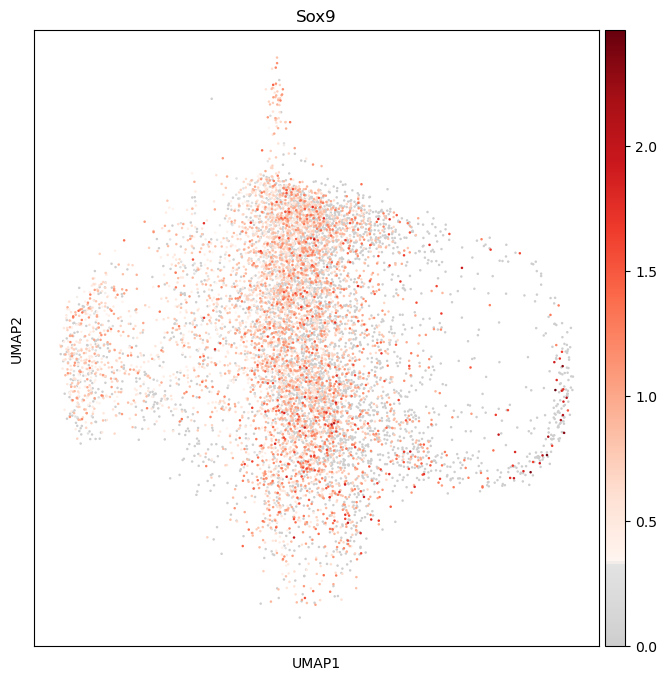

In [18]:
# Sox9
sc.pl.umap(adata, color='Sox9', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Sox9.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Sox9.pdf", 
          "../results/task1/9591-2D/Cluster0/Sox9.pdf")

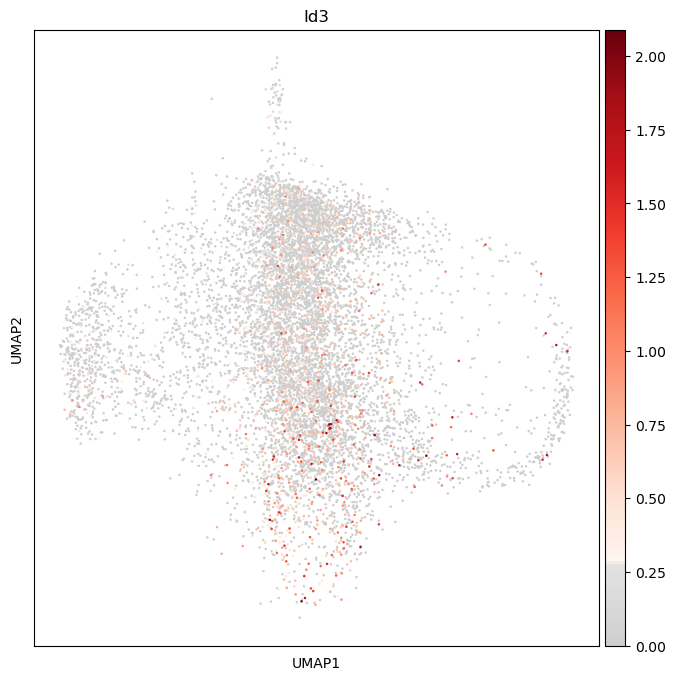

In [19]:
# Id3
sc.pl.umap(adata, color='Id3', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Id3.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Id3.pdf", 
          "../results/task1/9591-2D/Cluster0/Id3.pdf")

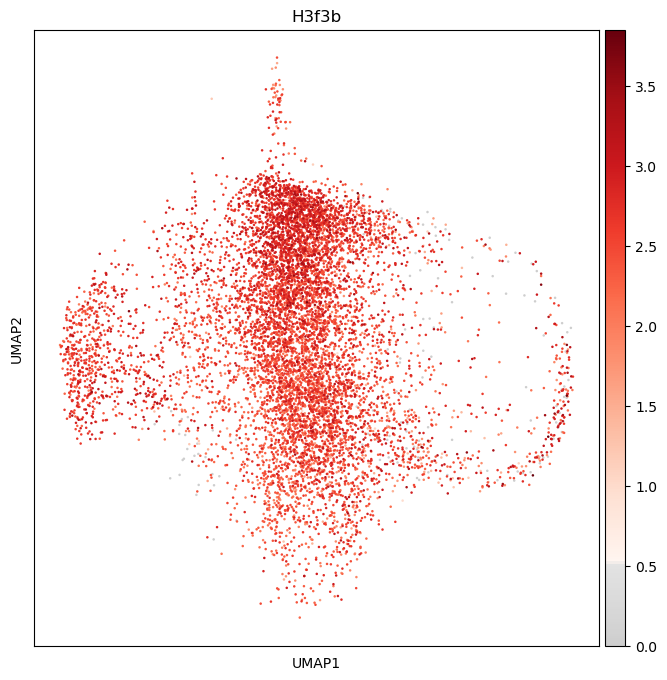

In [20]:
# H3f3b
sc.pl.umap(adata, color='H3f3b', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/H3f3b.pdf')
os.rename("figures/umap/9591-2D/Cluster0/H3f3b.pdf", 
          "../results/task1/9591-2D/Cluster0/H3f3b.pdf")

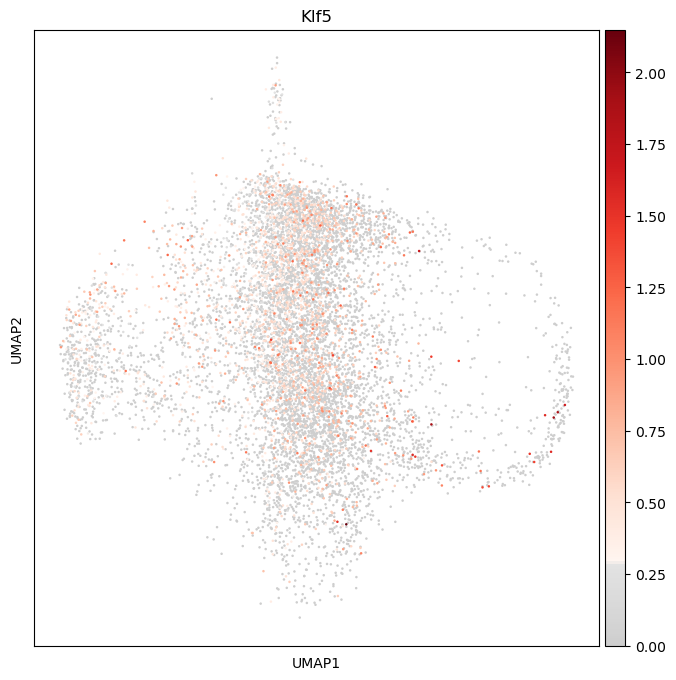

In [21]:
# Klf5
sc.pl.umap(adata, color='Klf5', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Klf5.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Klf5.pdf", 
          "../results/task1/9591-2D/Cluster0/Klf5.pdf")

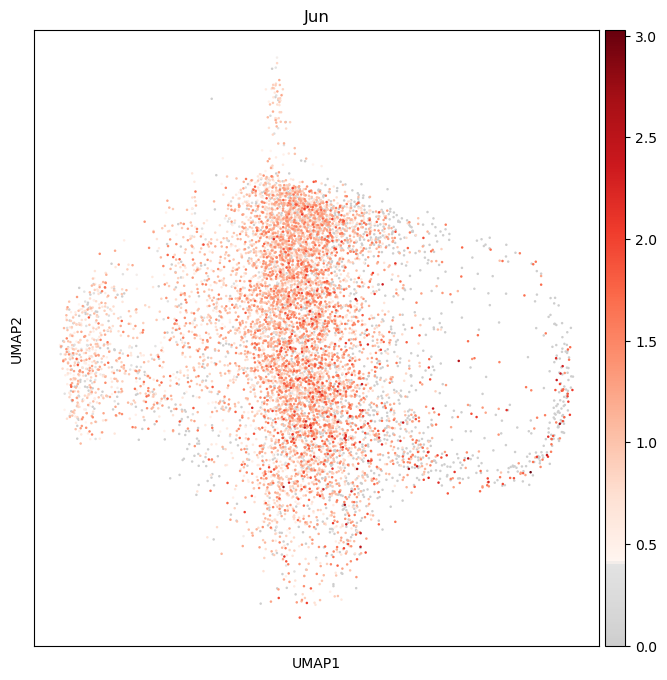

In [22]:
# Jun
sc.pl.umap(adata, color='Jun', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Jun.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Jun.pdf", 
          "../results/task1/9591-2D/Cluster0/Jun.pdf")

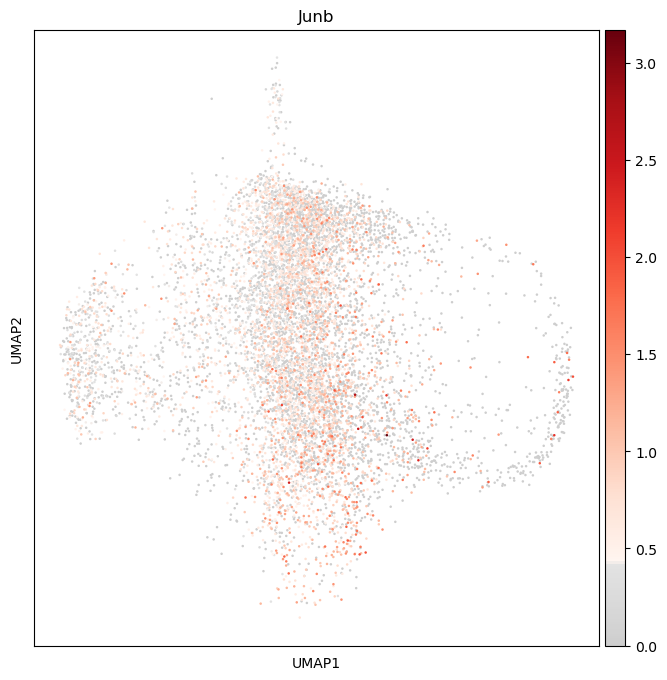

In [23]:
# Junb
sc.pl.umap(adata, color='Junb', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Junb.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Junb.pdf", 
          "../results/task1/9591-2D/Cluster0/Junb.pdf")

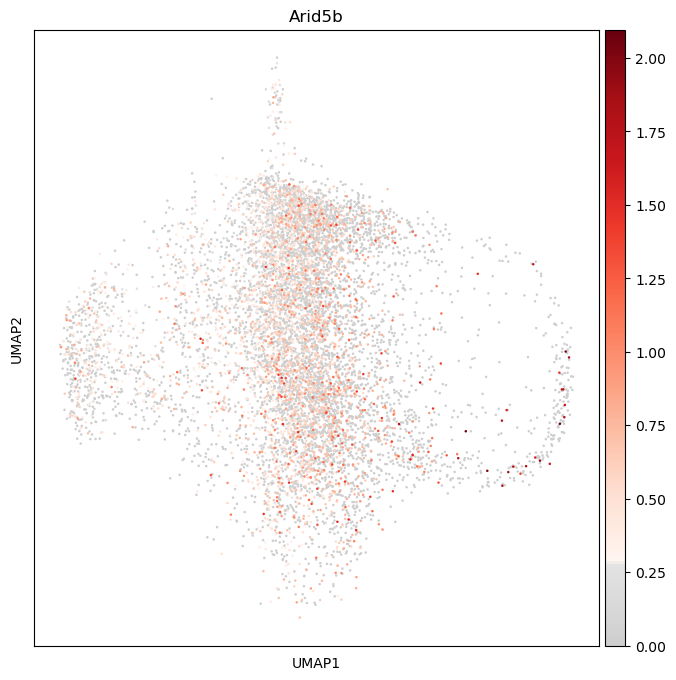

In [24]:
# Arid5b
sc.pl.umap(adata, color='Arid5b', use_raw=False, color_map=mymap, save='/9591-2D/Cluster0/Arid5b.pdf')
os.rename("figures/umap/9591-2D/Cluster0/Arid5b.pdf", 
          "../results/task1/9591-2D/Cluster0/Arid5b.pdf")

### Cluster 1

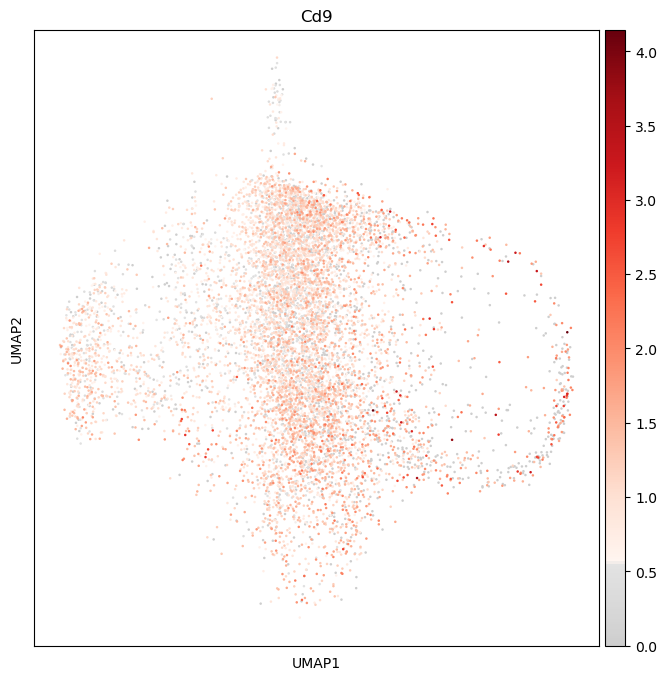

In [25]:
# Cd9
sc.pl.umap(adata, color='Cd9', use_raw=False, color_map=mymap, save='/9591-2D/Cluster1/Cd9.pdf')
os.rename("figures/umap/9591-2D/Cluster1/Cd9.pdf", 
          "../results/task1/9591-2D/Cluster1/Cd9.pdf")

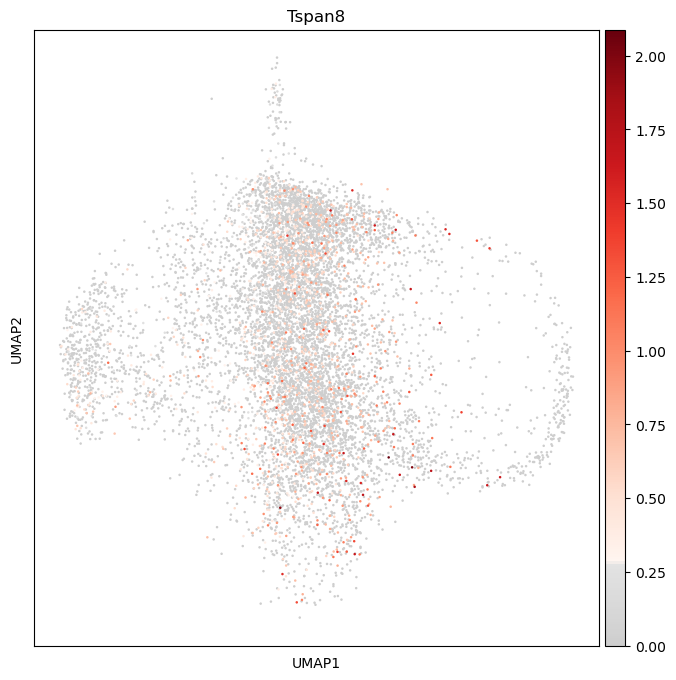

In [26]:
# Tspan8
sc.pl.umap(adata, color='Tspan8', use_raw=False, color_map=mymap, save='/9591-2D/Cluster1/Tspan8.pdf')
os.rename("figures/umap/9591-2D/Cluster1/Tspan8.pdf", 
          "../results/task1/9591-2D/Cluster1/Tspan8.pdf")

### Cluster 2

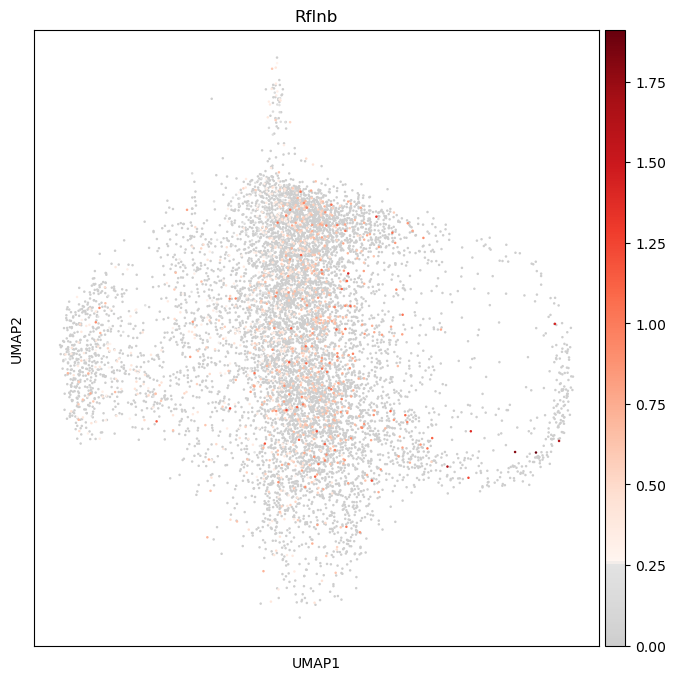

In [27]:
# Rflnb
sc.pl.umap(adata, color='Rflnb', use_raw=False, color_map=mymap, save='/9591-2D/Cluster2/Rflnb.pdf')
os.rename("figures/umap/9591-2D/Cluster2/Rflnb.pdf", 
          "../results/task1/9591-2D/Cluster2/Rflnb.pdf")

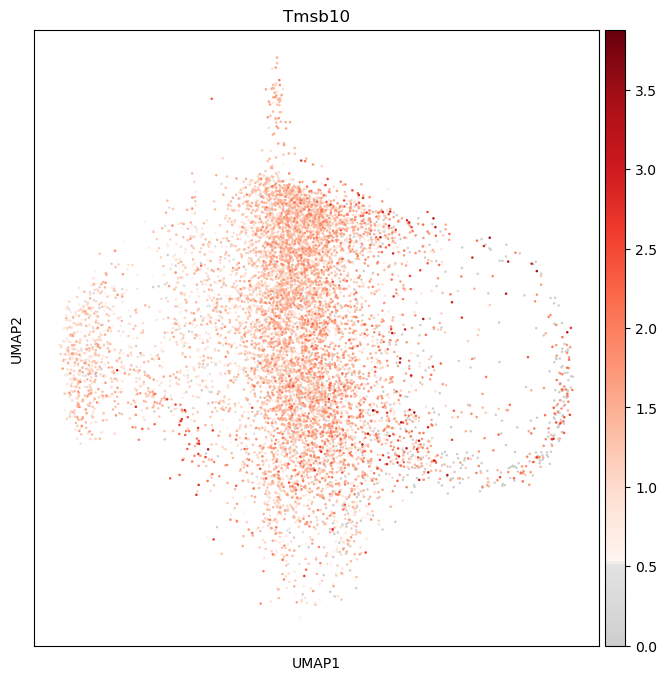

In [28]:
# Tmsb10
sc.pl.umap(adata, color='Tmsb10', use_raw=False, color_map=mymap, save='/9591-2D/Cluster2/Tmsb10.pdf')
os.rename("figures/umap/9591-2D/Cluster2/Tmsb10.pdf", 
          "../results/task1/9591-2D/Cluster2/Tmsb10.pdf")

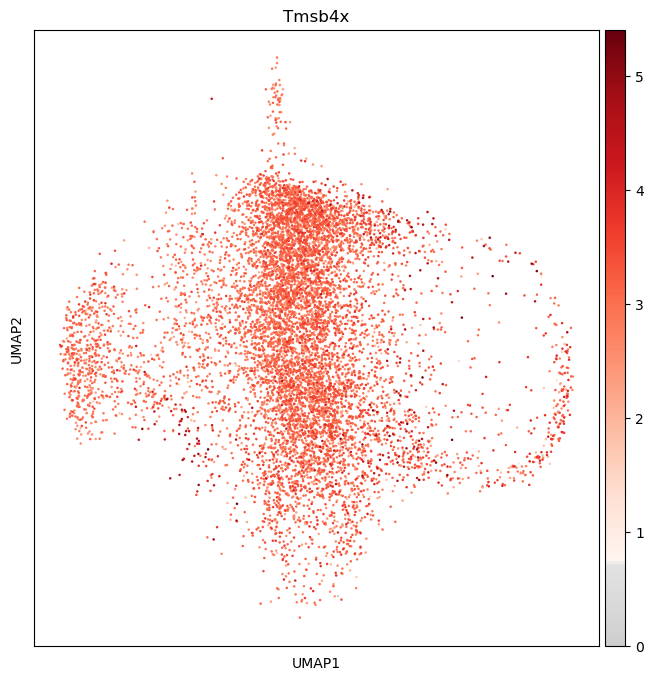

In [29]:
# Tmsb4x
sc.pl.umap(adata, color='Tmsb4x', use_raw=False, color_map=mymap, save='/9591-2D/Cluster2/Tmsb4x.pdf')
os.rename("figures/umap/9591-2D/Cluster2/Tmsb4x.pdf", 
          "../results/task1/9591-2D/Cluster2/Tmsb4x.pdf")

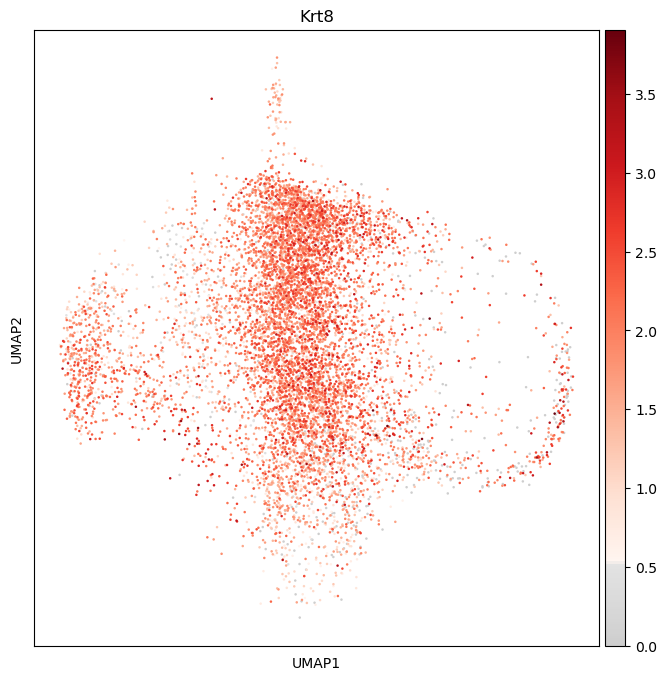

In [30]:
# Krt8
sc.pl.umap(adata, color='Krt8', use_raw=False, color_map=mymap, save='/9591-2D/Cluster2/Krt8.pdf')
os.rename("figures/umap/9591-2D/Cluster2/Krt8.pdf", 
          "../results/task1/9591-2D/Cluster2/Krt8.pdf")

### Cluster 3

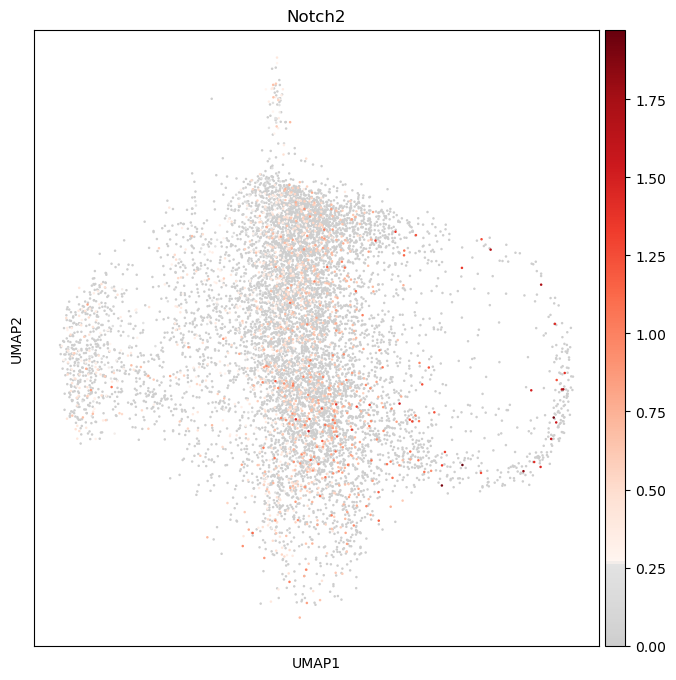

In [31]:
# Notch2
sc.pl.umap(adata, color='Notch2', use_raw=False, color_map=mymap, save='/9591-2D/Cluster3/Notch2.pdf')
os.rename("figures/umap/9591-2D/Cluster3/Notch2.pdf", 
          "../results/task1/9591-2D/Cluster3/Notch2.pdf")

### Cluster 4

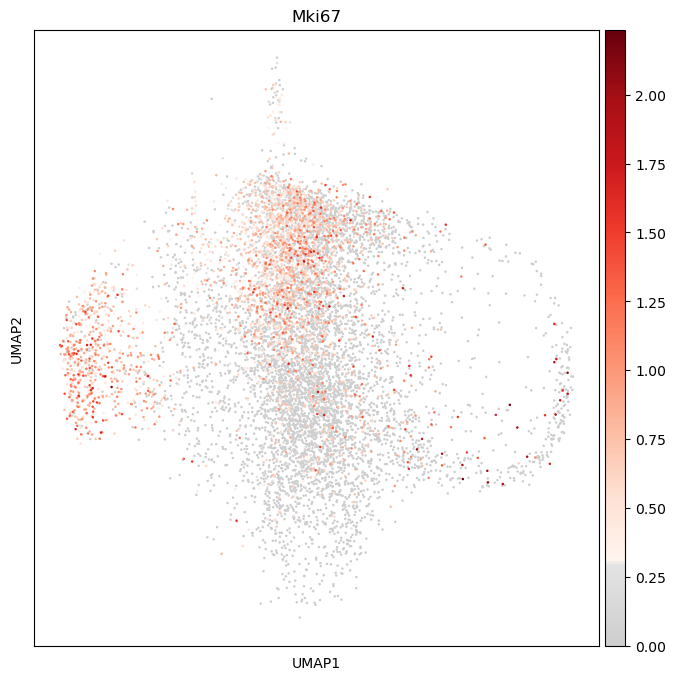

In [32]:
# Mki67
sc.pl.umap(adata, color='Mki67', use_raw=False, color_map=mymap, save='/9591-2D/Cluster4/Mki67.pdf')
os.rename("figures/umap/9591-2D/Cluster4/Mki67.pdf", 
          "../results/task1/9591-2D/Cluster4/Mki67.pdf")

### New Set
9591:
Ulk4
Spp1
Spry2
Notch2
Kif9
Mik67
H2az1
Ran
Tagln2
Ccnd1
Pmepa1
Lmna
Ezr
Tpm1
Tpt1
Btg2
Ecf2
Onecut2
Fth1

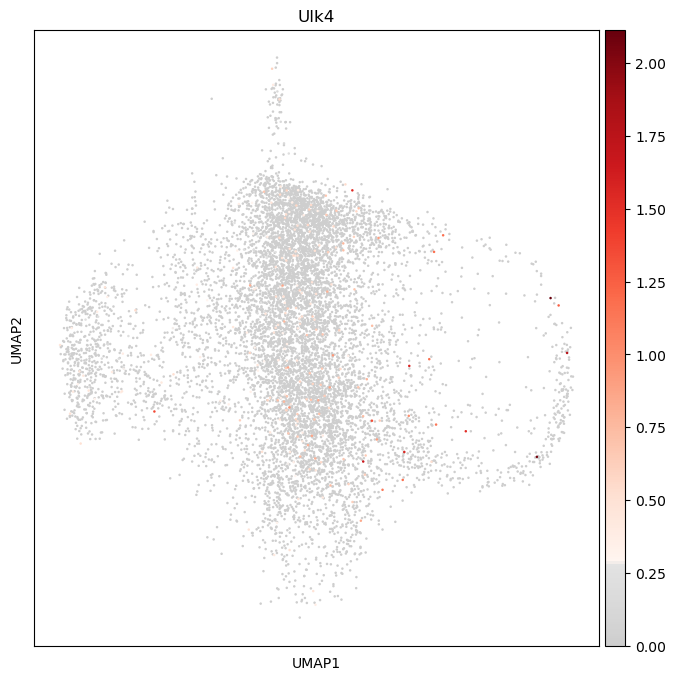

In [33]:
# Ulk4
sc.pl.umap(adata, color='Ulk4', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Ulk4.pdf')
os.rename("figures/umap/9591-2D/New_set/Ulk4.pdf", 
          "../results/task1/9591-2D/New_set/Ulk4.pdf")

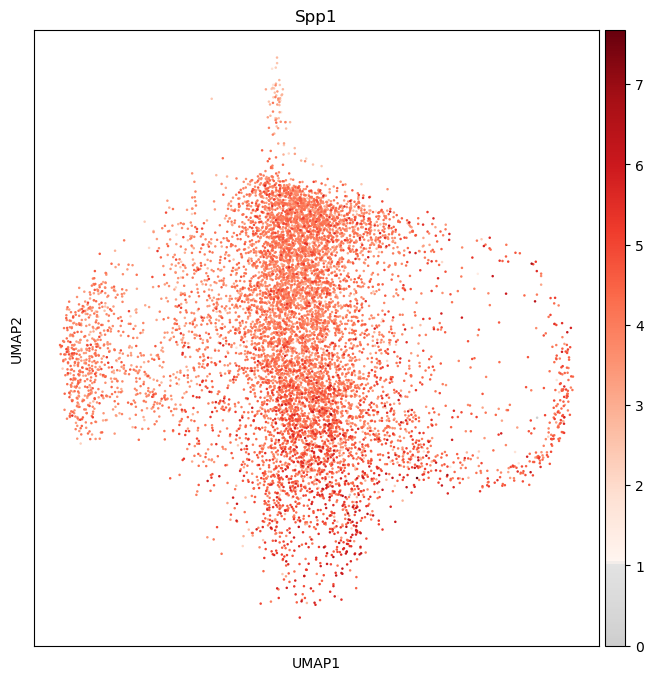

In [34]:
# Spp1
sc.pl.umap(adata, color='Spp1', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Spp1.pdf')
os.rename("figures/umap/9591-2D/New_set/Spp1.pdf", 
          "../results/task1/9591-2D/New_set/Spp1.pdf")

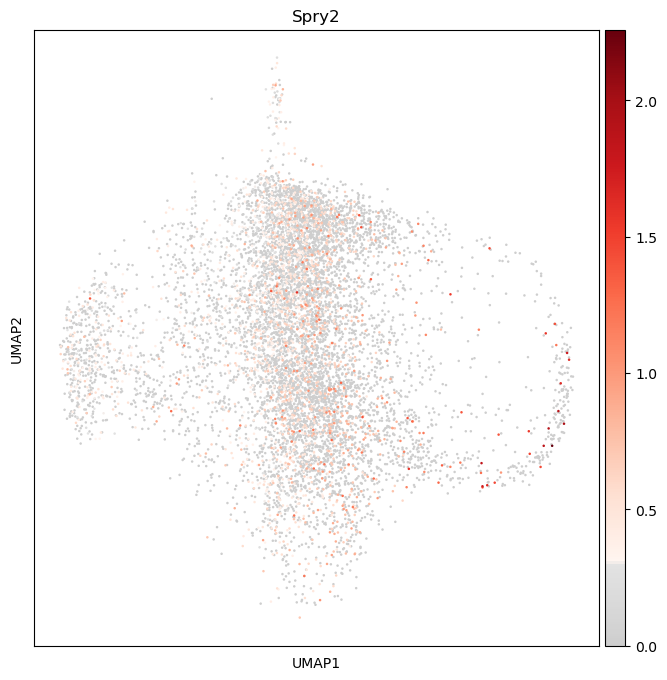

In [35]:
# Spry2
sc.pl.umap(adata, color='Spry2', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Spry2.pdf')
os.rename("figures/umap/9591-2D/New_set/Spry2.pdf", 
          "../results/task1/9591-2D/New_set/Spry2.pdf")

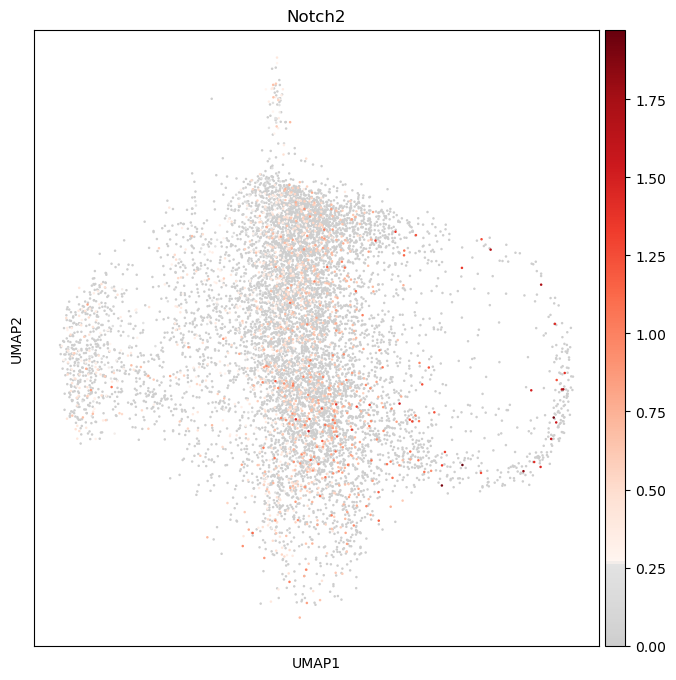

In [36]:
# Notch2
sc.pl.umap(adata, color='Notch2', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Notch2.pdf')
os.rename("figures/umap/9591-2D/New_set/Notch2.pdf", 
          "../results/task1/9591-2D/New_set/Notch2.pdf")

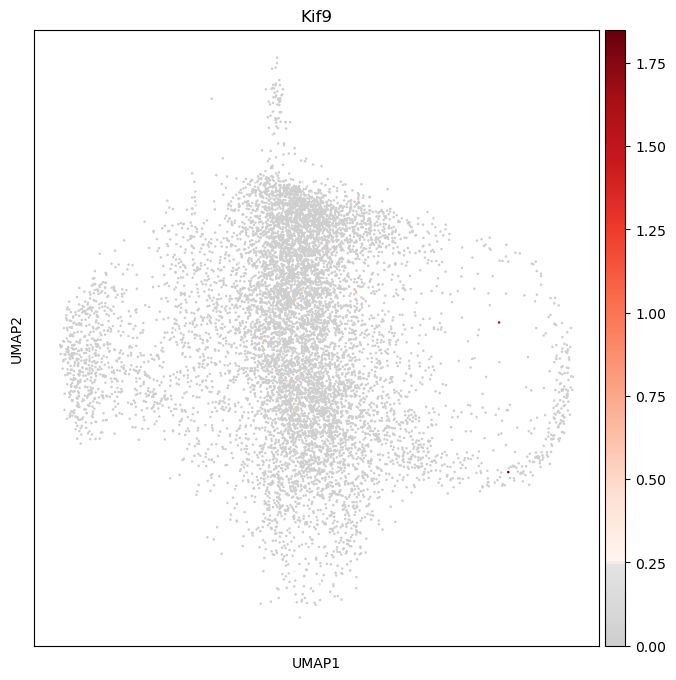

In [37]:
# Kif9
sc.pl.umap(adata, color='Kif9', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Kif9.pdf')
os.rename("figures/umap/9591-2D/New_set/Kif9.pdf", 
          "../results/task1/9591-2D/New_set/Kif9.pdf")

False
True


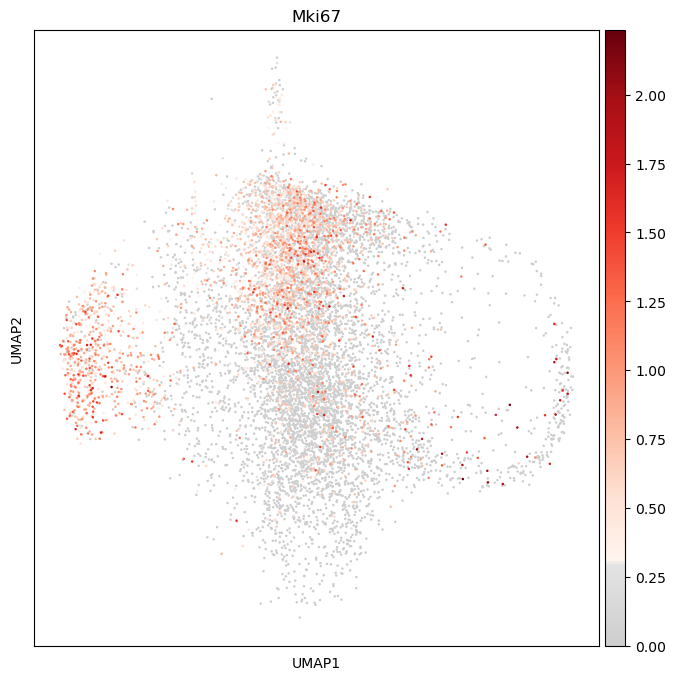

In [38]:
# Mik67 is not a var name!
# sc.pl.umap(adata, color='Mik67', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Mik67.pdf')
# os.rename("figures/umap/9591-2D/New_set/Mik67.pdf", 
#           "../results/task1/9591-2D/New_set/Mik67.pdf")
print('Mik67' in adata.var_names.tolist())
# Did you mean 'Mki67'?
print('Mki67' in adata.var_names.tolist())
sc.pl.umap(adata, color='Mki67', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Mki67.pdf')
os.rename("figures/umap/9591-2D/New_set/Mki67.pdf", 
          "../results/task1/9591-2D/New_set/Mki67.pdf")

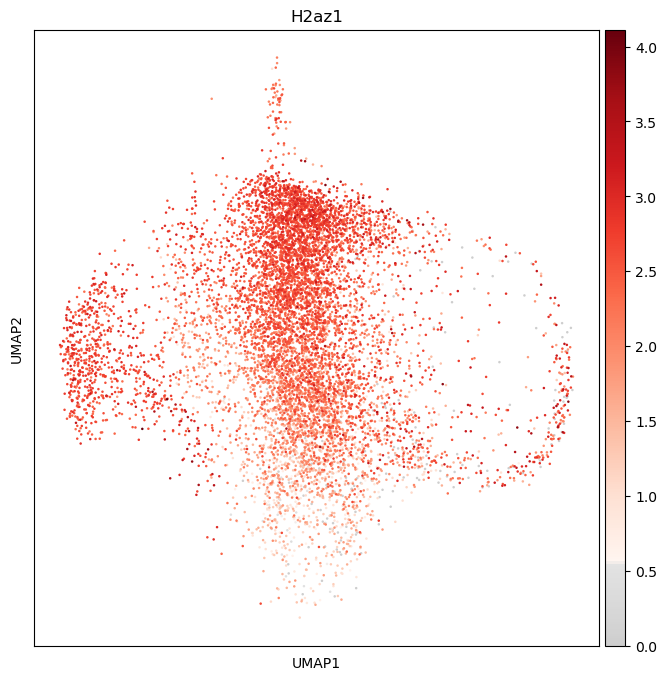

In [39]:
# H2az1
sc.pl.umap(adata, color='H2az1', use_raw=False, color_map=mymap, save='/9591-2D/New_set/H2az1.pdf')
os.rename("figures/umap/9591-2D/New_set/H2az1.pdf", 
          "../results/task1/9591-2D/New_set/H2az1.pdf")

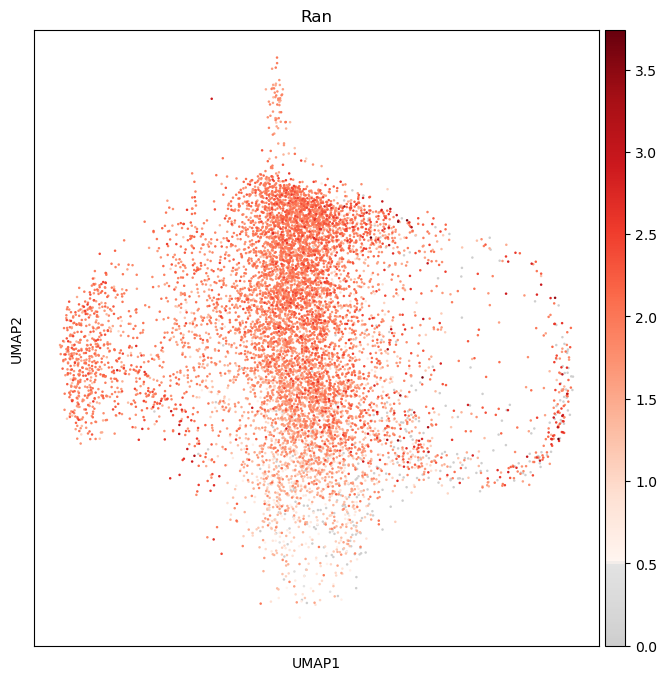

In [40]:
# Ran
sc.pl.umap(adata, color='Ran', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Ran.pdf')
os.rename("figures/umap/9591-2D/New_set/Ran.pdf", 
          "../results/task1/9591-2D/New_set/Ran.pdf")

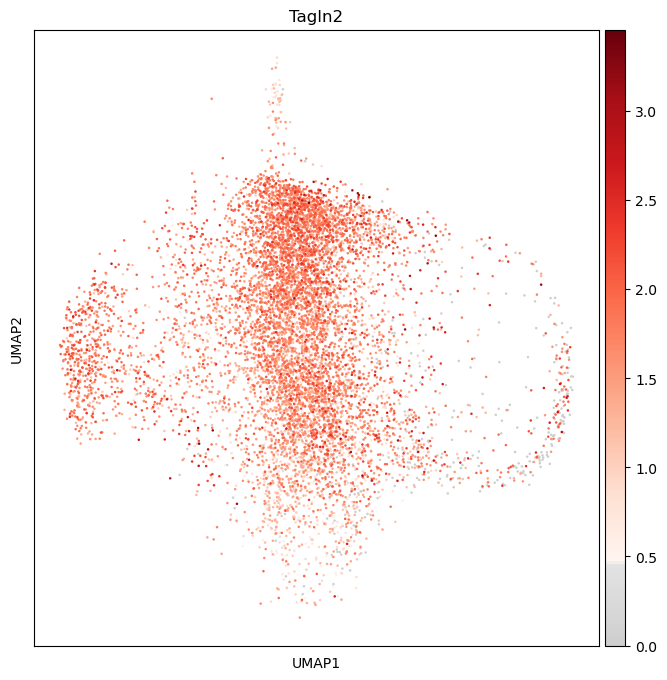

In [41]:
# Tagln2
sc.pl.umap(adata, color='Tagln2', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Tagln2.pdf')
os.rename("figures/umap/9591-2D/New_set/Tagln2.pdf", 
          "../results/task1/9591-2D/New_set/Tagln2.pdf")

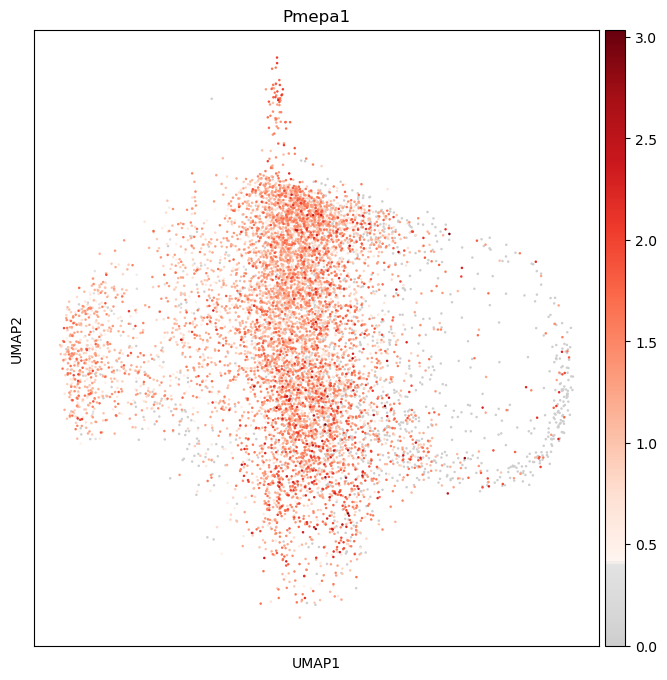

In [42]:
# Pmepa1
sc.pl.umap(adata, color='Pmepa1', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Pmepa1.pdf')
os.rename("figures/umap/9591-2D/New_set/Pmepa1.pdf", 
          "../results/task1/9591-2D/New_set/Pmepa1.pdf")

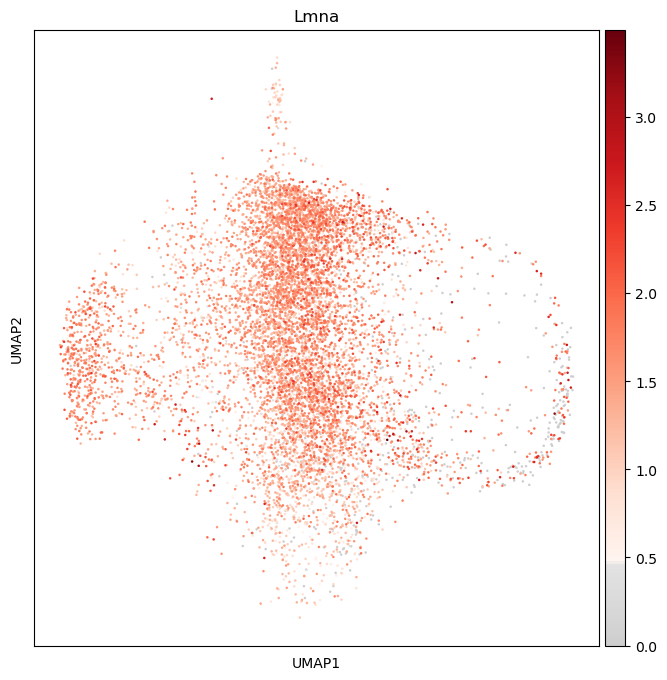

In [43]:
# Lmna
sc.pl.umap(adata, color='Lmna', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Lmna.pdf')
os.rename("figures/umap/9591-2D/New_set/Lmna.pdf", 
          "../results/task1/9591-2D/New_set/Lmna.pdf")

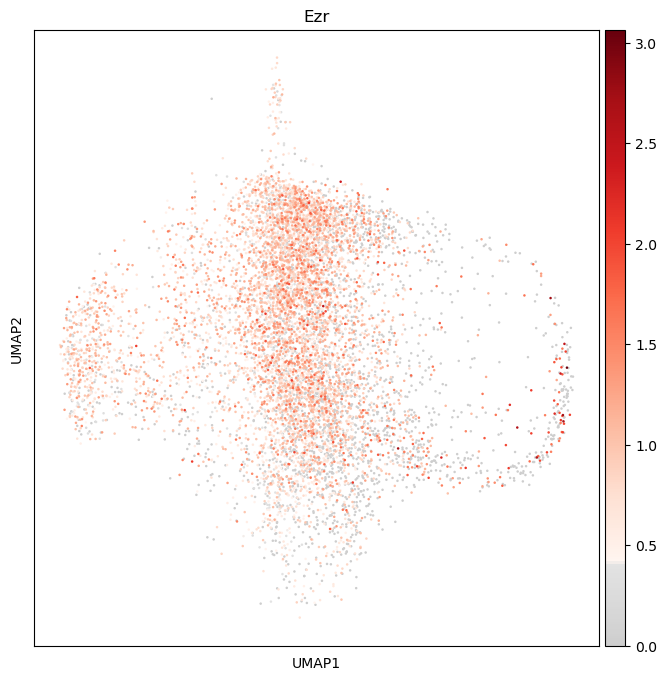

In [44]:
# Ezr
sc.pl.umap(adata, color='Ezr', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Ezr.pdf')
os.rename("figures/umap/9591-2D/New_set/Ezr.pdf", 
          "../results/task1/9591-2D/New_set/Ezr.pdf")

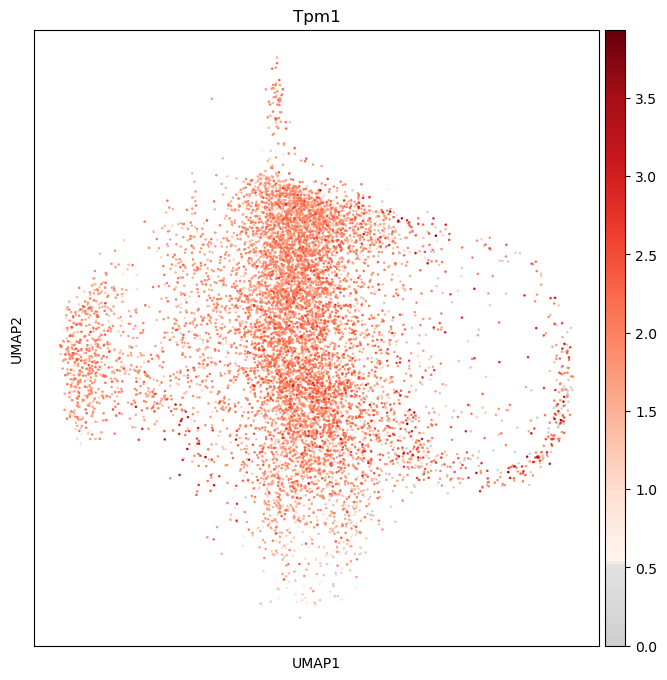

In [45]:
# Tpm1
sc.pl.umap(adata, color='Tpm1', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Tpm1.pdf')
os.rename("figures/umap/9591-2D/New_set/Tpm1.pdf", 
          "../results/task1/9591-2D/New_set/Tpm1.pdf")

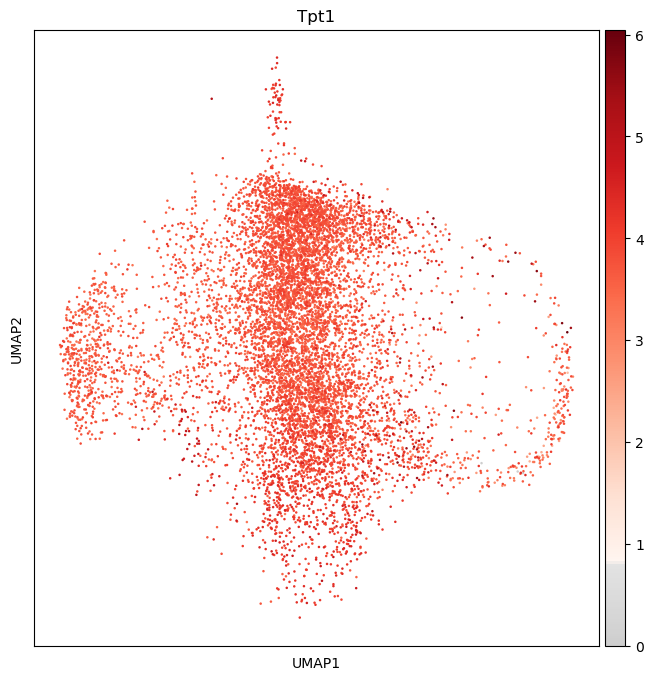

In [46]:
# Tpt1
sc.pl.umap(adata, color='Tpt1', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Tpt1.pdf')
os.rename("figures/umap/9591-2D/New_set/Tpt1.pdf", 
          "../results/task1/9591-2D/New_set/Tpt1.pdf")

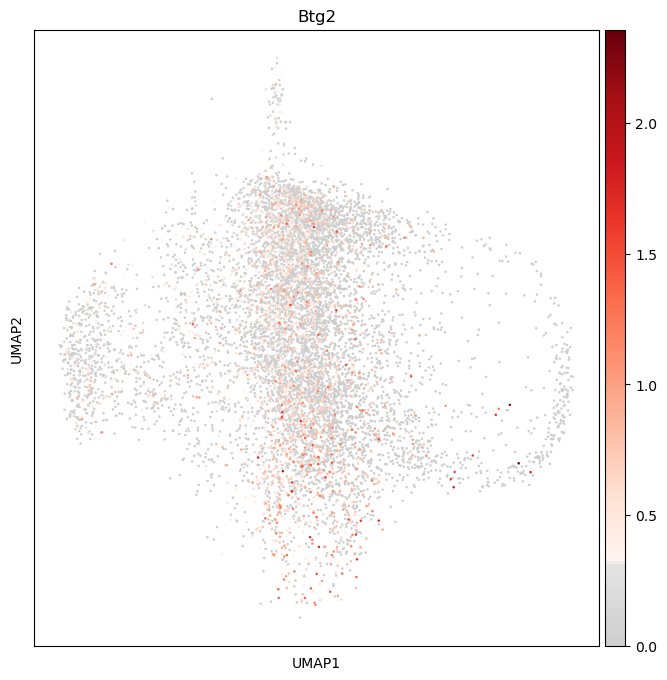

In [47]:
# Btg2
sc.pl.umap(adata, color='Btg2', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Btg2.pdf')
os.rename("figures/umap/9591-2D/New_set/Btg2.pdf", 
          "../results/task1/9591-2D/New_set/Btg2.pdf")

In [48]:
# Ecf2
# sc.pl.umap(adata, color='Ecf2', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Ecf2.pdf')
# os.rename("figures/umap/9591-2D/New_set/Ecf2.pdf", 
#           "../results/task1/9591-2D/New_set/Ecf2.pdf")
print('Ecf2' in adata.var_names.tolist())

False


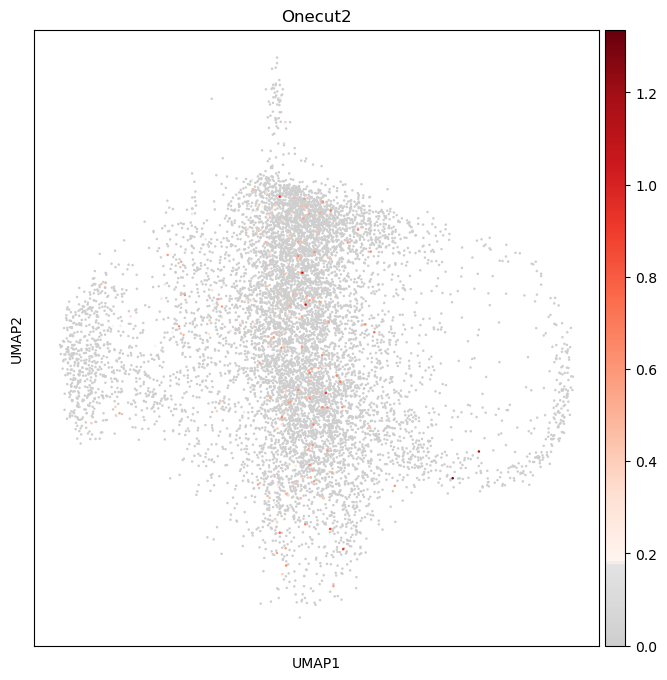

In [49]:
# Onecut2
sc.pl.umap(adata, color='Onecut2', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Onecut2.pdf')
os.rename("figures/umap/9591-2D/New_set/Onecut2.pdf", 
          "../results/task1/9591-2D/New_set/Onecut2.pdf")

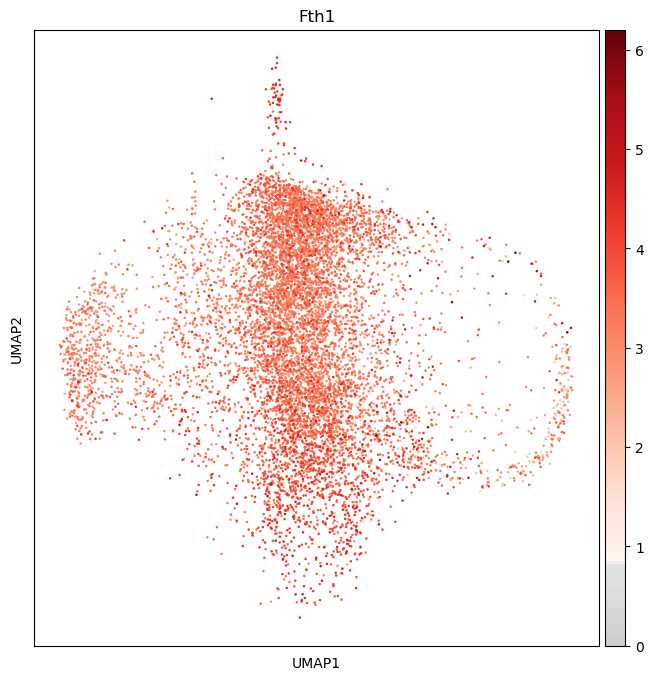

In [50]:
# Fth1
sc.pl.umap(adata, color='Fth1', use_raw=False, color_map=mymap, save='/9591-2D/New_set/Fth1.pdf')
os.rename("figures/umap/9591-2D/New_set/Fth1.pdf", 
          "../results/task1/9591-2D/New_set/Fth1.pdf")